# Text Generation and POS Tagging on English Dataset

In [ ]:
import nltk
import pandas as pd
from nltk.corpus import brown
from nltk.tokenize import regexp_tokenize
nltk.download('brown')
brownCorpus = nltk.Text(nltk.corpus.brown.words(nltk.corpus.brown.fileids()))
print(len(brownCorpus))

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.


1161192


In [ ]:
type(brownCorpus)

nltk.text.Text

## Cleaning of Brown corpus

In [ ]:
text = "Let's see how it's working."
lis = regexp_tokenize(text, "[\w']+")
lis.append(text[-1])
lis

["Let's", 'see', 'how', "it's", 'working', '.']

In [ ]:
sentences = [" ".join(sent) for sent in brown.sents()[:]]
len(sentences)

57340

In [ ]:
#number_of_words_in_sentences = []
setn = []
for sentence in sentences:
    #uniqueTokens = set()
    lis = regexp_tokenize(sentence, "[\w']+")
    lis.append(text[-1])
    setn.append(lis)
    #number_of_words_in_sentences.append(len(regexp_tokenize(sentence, "[\w']+")))

#setn[0][:]
setn1 = []
for word_list in setn:
    #print(word_list)
    word_list1 = []
    for word in word_list:
        if word != "''" and word.isnumeric() == False:
            word_list1.append(word)
    setn1.append(word_list1)

len(sentences)

57340

In [ ]:
sentences[0:5]

["The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced `` no evidence '' that any irregularities took place .",
 "The jury further said in term-end presentments that the City Executive Committee , which had over-all charge of the election , `` deserves the praise and thanks of the City of Atlanta '' for the manner in which the election was conducted .",
 "The September-October term jury had been charged by Fulton Superior Court Judge Durwood Pye to investigate reports of possible `` irregularities '' in the hard-fought primary which was won by Mayor-nominate Ivan Allen Jr. .",
 "`` Only a relative handful of such reports was received '' , the jury said , `` considering the widespread interest in the election , the number of voters and the size of this city '' .",
 "The jury said it did find that many of Georgia's registration and election laws `` are outmoded or inadequate and often ambiguous '' ."]

In [ ]:
j = 0
setn1 = list(filter(lambda item: len(item) != 1, setn1))
sentence = []
for word_list in setn1:
    string = " ".join(word_list[:-1])
    string = string + word_list[-1]
    sentence.append(string)
sentence[0:10]

["The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced no evidence that any irregularities took place.",
 'The jury further said in term end presentments that the City Executive Committee which had over all charge of the election deserves the praise and thanks of the City of Atlanta for the manner in which the election was conducted.',
 'The September October term jury had been charged by Fulton Superior Court Judge Durwood Pye to investigate reports of possible irregularities in the hard fought primary which was won by Mayor nominate Ivan Allen Jr.',
 'Only a relative handful of such reports was received the jury said considering the widespread interest in the election the number of voters and the size of this city.',
 "The jury said it did find that many of Georgia's registration and election laws are outmoded or inadequate and often ambiguous.",
 'It recommended that Fulton legislators act to have these laws studied and revised to t

In [ ]:
len(sentence)

56834

## Heaps Law, Zeph Law and Data Exploration

In [ ]:
j = 0
setn1 = list(filter(lambda item: len(item) != 1, setn1))
sentence = []
for word_list in setn1:
    string = " ".join(word_list[:-1])
    #string = string + word_list[-1]
    sentence.append(string)
sentence[0:1]

["The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced no evidence that any irregularities took place"]

In [ ]:
no_of_words = []
no_of_words_unique = []
j = 0
for words in sentence:
    no_of_words.append(len(words.split()))
    uniqueTokens = set()
    uniqueTokens = set(words.split())
    no_of_words_unique.append(len(list(uniqueTokens)))

In [ ]:
word_list = []
for sen in sentence:
    word_list.append(sen.split())

In [ ]:
df = pd.DataFrame()
df['sentence'] = sentence
df['no_of_words'] = no_of_words
df['no_of_words_unique'] = no_of_words_unique
df['words_in_list'] = word_list
df['cal_no_of_words_unique'] = 100 * df['no_of_words']**0.4
df = df[df['no_of_words']!=1]
df = df[df['no_of_words']!=2]
df = df[df['no_of_words']!=3]
df = df.sort_values(by = 'no_of_words', ascending = True)

In [ ]:
df.head(10)

,sentence,no_of_words,no_of_words_unique,words_in_list,cal_no_of_words_unique
49517,Oh I'd love to,4,4,"[Oh, I'd, love, to]",174.110113
47784,Why had I registered,4,4,"[Why, had, I, registered]",174.110113
51049,He scarcely saw them,4,4,"[He, scarcely, saw, them]",174.110113
40826,Not like us fellas,4,4,"[Not, like, us, fellas]",174.110113
18833,Bring me the firecrackers,4,4,"[Bring, me, the, firecrackers]",174.110113
40818,But you ain't Henry,4,4,"[But, you, ain't, Henry]",174.110113
31358,The thyroid stimulating hormone,4,4,"[The, thyroid, stimulating, hormone]",174.110113
37880,Yet he was here,4,4,"[Yet, he, was, here]",174.110113
31373,Pierce Carsten and Wynston,4,4,"[Pierce, Carsten, and, Wynston]",174.110113
38546,Ludie could be hateful,4,4,"[Ludie, could, be, hateful]",174.110113


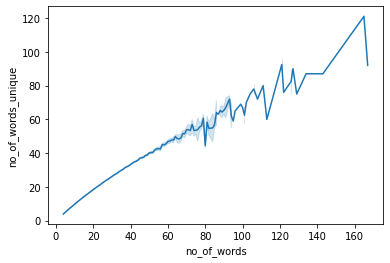

In [ ]:
import seaborn as sns
sns.lineplot(x = 'no_of_words',y = 'no_of_words_unique', data = df )

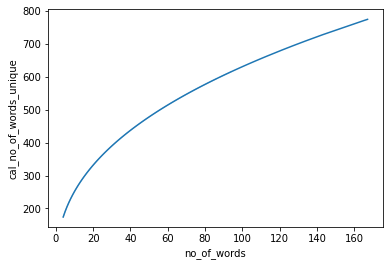

In [ ]:
sns.lineplot(x = 'no_of_words',y = 'cal_no_of_words_unique', data = df )

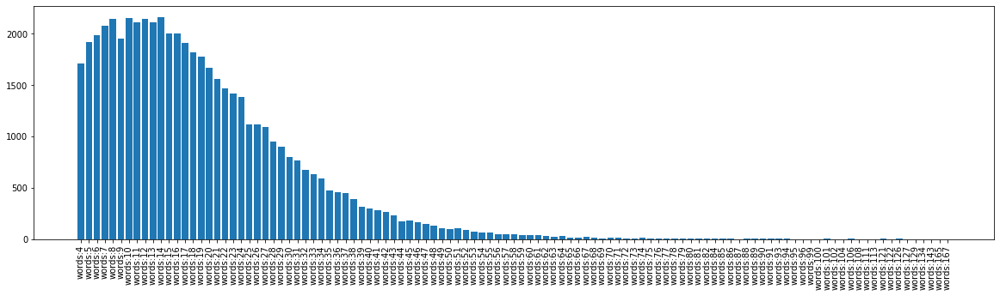

In [ ]:
import matplotlib.pyplot as plt
t1 = pd.DataFrame(df[['no_of_words','sentence']].groupby('no_of_words').count())
t1 = t1.reset_index()
t1['no_of_words'] = 'words:' + t1['no_of_words'].astype(str)
t1.sort_values(by = 'sentence', ascending = False)
fig = plt.figure(figsize=(20, 5))
#creating the bar plot
plt.bar(t1['no_of_words'], t1['sentence']);
plt.xticks(rotation=90);

In [ ]:
from collections import Counter
result = Counter(" ".join(df['sentence'].values.tolist()).split(" ")).items()
result

dict_items([('Oh', 82), ("I'd", 103), ('love', 216), ('to', 25774), ('Why', 138), ('had', 5088), ('I', 5060), ('registered', 22), ('He', 2846), ('scarcely', 25), ('saw', 350), ('them', 1769), ('Not', 155), ('like', 1284), ('us', 669), ('fellas', 1), ('Bring', 2), ('me', 1139), ('the', 62679), ('firecrackers', 2), ('But', 1350), ('you', 2714), ("ain't", 40), ('Henry', 83), ('The', 7170), ('thyroid', 40), ('stimulating', 12), ('hormone', 13), ('Yet', 135), ('he', 6538), ('was', 9714), ('here', 601), ('Pierce', 5), ('Carsten', 1), ('and', 27925), ('Wynston', 1), ('Ludie', 12), ('could', 1576), ('be', 6348), ('hateful', 3), ('dogs', 65), ('were', 3267), ('tired', 48), ('Come', 32), ('a', 21936), ('bit', 102), ('closer', 59), ('She', 844), ('from', 4199), ('Prague', 3), ('It', 2003), ("won't", 100), ('work', 763), ('Colonel', 27), ('course', 458), ('can', 1734), ('police', 136), ('captain', 44), ('chortled', 3), ('Careful', 2), ('now', 1032), ('Jones', 74), ('warned', 22), ('Means', 18), ('

In [ ]:
from collections import Counter
cnt = Counter()
j = 0
for text in word_list:
    for t in text:
        cnt[t] += 1
# See most common ten words
cnt.most_common(10)

[('the', 62744),
 ('of', 36141),
 ('and', 27997),
 ('to', 25821),
 ('a', 21961),
 ('in', 19619),
 ('that', 10238),
 ('is', 10011),
 ('was', 9777),
 ('for', 8852)]

In [ ]:
type(cnt)

collections.Counter

In [ ]:
import pandas as pd
word_freq = pd.DataFrame(cnt.most_common(300),columns=['words', 'count'])
word_freq.head()

,words,count
0,the,62744
1,of,36141
2,and,27997
3,to,25821
4,a,21961


In [ ]:
word_freq['count'].sum()
word_freq['proportion'] = word_freq['count']/561954
pp = []
for i in range(word_freq.shape[0]):
    predicted_proportion = (1/(i+1))/561954
    pp.append(predicted_proportion) 
word_freq['predicted_proportion'] = pp
word_freq.head()

,words,count,proportion,predicted_proportion
0,the,62744,0.111653,1.779505e-06
1,of,36141,0.064313,8.897525e-07
2,and,27997,0.049821,5.931684e-07
3,to,25821,0.045949,4.448763e-07
4,a,21961,0.039080,3.559010e-07


Zipps Law

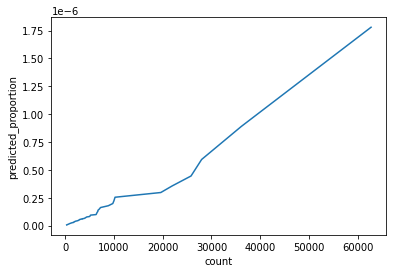

In [ ]:
sns.lineplot(x = 'count',y = 'predicted_proportion', data = word_freq )

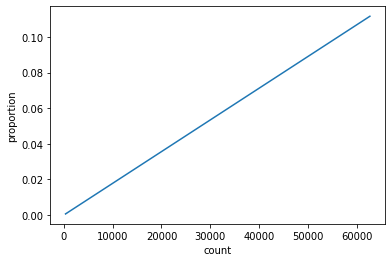

In [ ]:
import seaborn as sns
sns.lineplot(x = 'count',y = 'proportion', data = word_freq )

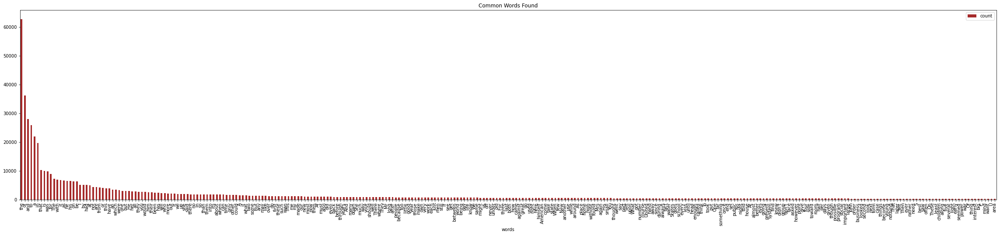

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(40, 8))

# Plot horizontal bar graph
word_freq.plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="brown")
ax.set_title("Common Words Found")
plt.show()


In [ ]:
tokens = []
for word in word_list:
    tokens.extend(word)

unique trigrams in brown corpus- 1014059
however possible bigrams : 2481534225


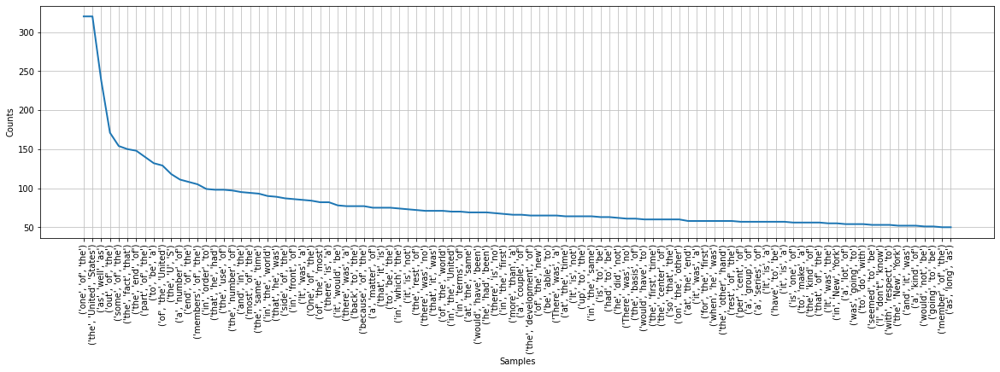

In [ ]:
#lis = brown.words()
from nltk.util import ngrams
n = 3 
trigrams = ngrams(tokens, n)      # The method ngrams from package ngrams takes in the total words in the corpus and with n = 2, provides the list of bigrams in the corpus
brown2gramFD = nltk.FreqDist(token for token in trigrams)
print("unique trigrams in brown corpus-", len(tokens))
print("however possible bigrams :", 49815*49815 )
plt.rcParams['figure.figsize'] = [20, 5]
brown2gramFD.plot(100)   

unique trigrams in brown corpus- 1014059
however possible bigrams : 2481534225


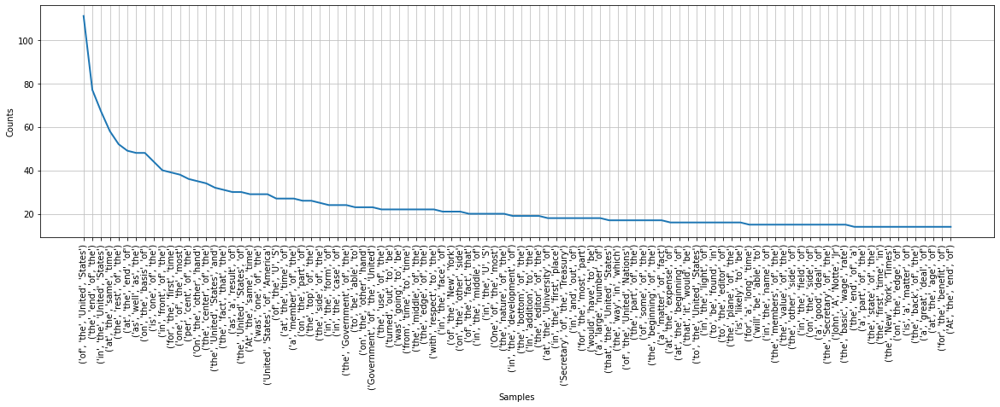

In [ ]:
n = 4
fourgrams = ngrams(tokens, n)      # The method ngrams from package ngrams takes in the total words in the corpus and with n = 2, provides the list of bigrams in the corpus
brown2gramFD = nltk.FreqDist(token for token in fourgrams)
print("unique trigrams in brown corpus-", len(tokens))
print("however possible bigrams :", 49815*49815 )
plt.rcParams['figure.figsize'] = [20, 5]
brown2gramFD.plot(100)   

unique trigrams in brown corpus- 1014059
however possible bigrams : 2481534225


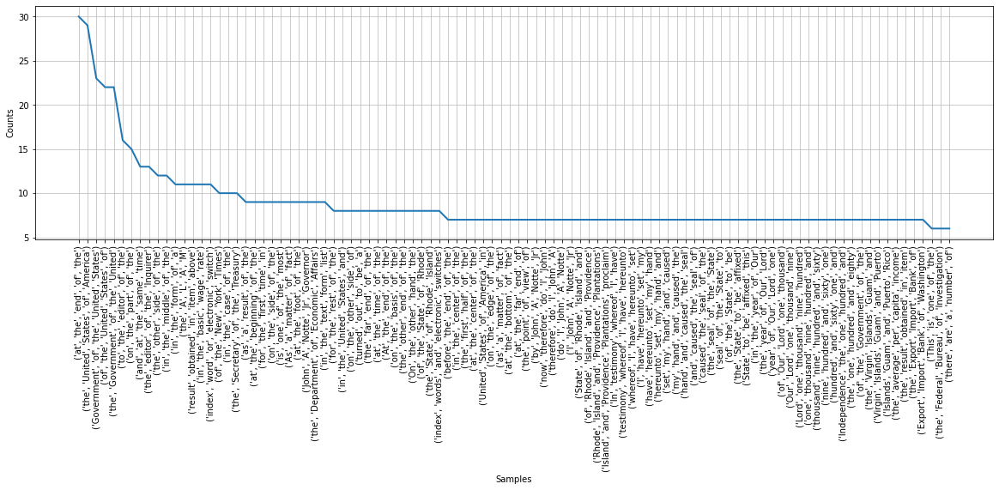

In [ ]:
n = 5
fivegrams = ngrams(tokens, n)      # The method ngrams from package ngrams takes in the total words in the corpus and with n = 2, provides the list of bigrams in the corpus
brown2gramFD = nltk.FreqDist(token for token in fivegrams)
print("unique trigrams in brown corpus-", len(tokens))
print("however possible bigrams :", 49815*49815 )
plt.rcParams['figure.figsize'] = [20, 5]
brown2gramFD.plot(100)  

In [ ]:
sentence[0].split()

['The',
 'Fulton',
 'County',
 'Grand',
 'Jury',
 'said',
 'Friday',
 'an',
 'investigation',
 'of',
 "Atlanta's",
 'recent',
 'primary',
 'election',
 'produced',
 'no',
 'evidence',
 'that',
 'any',
 'irregularities',
 'took',
 'place']

## Model Preparation

In [ ]:
n_grams = {}

In [ ]:
for sent in sentence:
    words =  [word for word in sent.split() if word[0].isalpha()]  # Eliminate punctuation
    for ix in range(len(words) - 1):
        try:
            n_grams[words[ix]].append(words[ix+1])
        except KeyError as _:
            n_grams[words[ix]] = []
            n_grams[words[ix]].append(words[ix+1])

In [ ]:
n_grams

{'The': ['Fulton',
  'jury',
  'September-October',
  'jury',
  'grand',
  'City',
  'grand',
  'jurors',
  'jury',
  'jury',
  'jury',
  'jury',
  'couple',
  'petition',
  'petition',
  'Hartsfield',
  "mayor's",
  'largest',
  'Republicans',
  'Georgia',
  'bond',
  'department',
  'Highway',
  'Constitution',
  'resolution',
  'new',
  'campaign',
  'former',
  'bill',
  'escheat',
  'bill',
  'TEA',
  'house',
  'senate',
  'third',
  'other',
  'West',
  'proposal',
  'bill',
  "bill's",
  'remainder',
  'board',
  'report',
  'report',
  'monthly',
  'volume',
  'disclosure',
  'statements',
  'President',
  'last',
  'cases',
  'case',
  'President',
  'aged',
  'social',
  'Kennedy',
  'payroll',
  'aged',
  'President',
  'plan',
  'President',
  'scholarship',
  'schools',
  'President',
  'President',
  'President',
  'President',
  'rule',
  'most',
  'nightmare',
  'general',
  'impression',
  'Secretary',
  'Secretary',
  "secretary's",
  'annual',
  'Kennedy',
  'United

In [ ]:
import random
def generate_sentence(nb = 12):
    words = []
    next_word = random.choice(list(n_grams.keys()))
    words.append(next_word)
    while len(words) < nb:
        next_word = random.choice(n_grams[next_word])
        words.append(next_word)
    return " ".join(words) 

### Automatic Tagger Implementation

In [ ]:
from nltk.corpus import brown
nltk.download('punkt')
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')
tags = [tag for (word, tag) in brown.tagged_words(categories='news')]
default_tagger = nltk.DefaultTagger('NN')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
 patterns = [(r'.*ing$', 'VBG'), # gerunds
             (r'.*ed$', 'VBD'), # simple past
             (r'.*es$', 'VBZ'), # 3rd singular present
             (r'.*ould$', 'MD'), # modals
             (r'.*\'s$', 'NN$'), # possessive nouns
             (r'.*s$', 'NNS'), # plural nouns
             (r'^-?[0-9]+(.[0-9]+)?$', 'CD'), # cardinal numbers
             (r'.*', 'NN') # nouns (default)
]
regexp_tagger = nltk.RegexpTagger(patterns)

In [ ]:
regexp_tagger.evaluate(brown_tagged_sents)

0.20326391789486245

In [ ]:
fd = nltk.FreqDist(brown.words(categories='news'))
cfd = nltk.ConditionalFreqDist(brown.tagged_words(categories='news'))
most_freq_words = list(fd.keys())[:100]
likely_tags = dict((word, cfd[word].max()) for word in most_freq_words)
baseline_tagger = nltk.UnigramTagger(model=likely_tags)
baseline_tagger.evaluate(brown_tagged_sents)

0.3329355371243312

In [ ]:
from nltk.corpus import brown
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')
unigram_tagger = nltk.UnigramTagger(brown_tagged_sents)
unigram_tagger.tag(brown_sents[2007])
size = int(len(brown_tagged_sents) * 0.9)
train_sents = brown_tagged_sents[:size]
test_sents = brown_tagged_sents[size:]
unigram_tagger = nltk.UnigramTagger(train_sents)
unigram_tagger.evaluate(test_sents)

0.8121200039868434

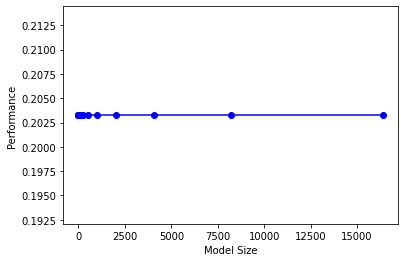

In [ ]:
baseline_tagger = nltk.UnigramTagger(model=likely_tags,backoff=nltk.DefaultTagger('NN'))
def performance(cfd, wordlist):
    lt = dict((word, cfd[word].max()) for word in wordlist)
    regexp_tagger = nltk.RegexpTagger(patterns)
    #baseline_tagger = nltk.UnigramTagger(model=lt, backoff=nltk.DefaultTagger('NN'))
    #return baseline_tagger.evaluate(brown.tagged_sents(categories='news'))
    return regexp_tagger.evaluate(brown.tagged_sents(categories='news'))

def display():
    import pylab
    words_by_freq = list(nltk.FreqDist(brown.words(categories='news')))
    cfd = nltk.ConditionalFreqDist(brown.tagged_words(categories='news'))
    sizes = 2 ** pylab.arange(15)
    perfs = [performance(cfd, words_by_freq[:size]) for size in sizes]
    pylab.plot(sizes, perfs, '-bo')
    #pylab.title('Lookup Tagger Performance with Varying Model Size')
    pylab.xlabel('Model Size')
    pylab.ylabel('Performance')
    pylab.show()
display() 

In [ ]:
bigram_tagger = nltk.BigramTagger(train_sents)

In [ ]:
unseen_sent = brown_sents[4203]

In [ ]:
t0 = nltk.DefaultTagger('NN')
t1 = nltk.UnigramTagger(train_sents, backoff=t0)
t2 = nltk.BigramTagger(train_sents, backoff=t1)
t2.evaluate(test_sents)

0.8452108043456593

In [ ]:
brown_tagged_sents = brown.tagged_sents(categories='news')
brown_sents = brown.sents(categories='news')
size = int(len(brown_tagged_sents) * 0.9)
train_sents = brown_tagged_sents[:size]
test_sents = brown_tagged_sents[size:]
t0 = nltk.DefaultTagger('NN')
t1 = nltk.UnigramTagger(train_sents, backoff=t0)
t2 = nltk.BigramTagger(train_sents, backoff=t1)
t2.evaluate(test_sents)

0.8452108043456593

## Extrinsic Evalutation of Model

In [ ]:
generate_sentence()

'tragic consequences if that WTV antigen in the new interest in the'

In [ ]:
lis = "tragic consequences if that WTV antigen in the new interest in the"
lis = lis.split()
t2.tag(lis)

[('tragic', 'NN'),
 ('consequences', 'NNS'),
 ('if', 'CS'),
 ('that', 'CS'),
 ('WTV', 'NN'),
 ('antigen', 'NN'),
 ('in', 'IN'),
 ('the', 'AT'),
 ('new', 'JJ'),
 ('interest', 'NN'),
 ('in', 'IN'),
 ('the', 'AT')]

In [ ]:
generate_sentence()

'comprehend her sight of being fanatical Hindu parties in Budapest we may'

In [ ]:
generate_sentence()

'unaccountable official of the school comes from the Western standards of school and in college in space should have never leave a constant supervision and Tuesday staged a most starkly'

In [ ]:
generate_sentence()

'curled up his lie in hell do anything about vocational education in the men were more will be no dancers seemed about them of presentational immediacy of cattle drove him'

In [ ]:
def generate_sentence_force(nb = 7):
    return " ".join([random.choice(list(n_grams.keys())) for _ in range(nb)])

In [ ]:
generate_sentence_force()

'Whaddya humane Hord jerky sponsorship desirability mediocrities'

In [ ]:
generate_sentence_force()

'Rauschenberg robbery mandated bedsprings courtyard dryer diffuses'

In [ ]:
generate_sentence_force()

'Invictus Owls Twelve tensional Forsan Hartley grudges'

In [ ]:
generate_sentence_force()

'voyager punish industriously strongrooms industrialization mess snorted'

# Similar Word Prediction on English Dataset

In [ ]:
import nltk
nltk.download('punkt')
from nltk.corpus import stopwords  
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from string import punctuation
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
words = {}
lis = []
for i in range(df.shape[0]):
    lis.extend(df.iloc[i][0].split(' '))
words = set(lis)

In [ ]:
from gensim.models import Word2Vec
model = Word2Vec([words], size=100, window=5, min_count=1, workers=4)

In [ ]:
vocabulary = model.wv.vocab

In [ ]:
vocabulary

{'thumbing': <gensim.models.keyedvectors.Vocab at 0x7f9611cca7d0>,
 'strategists': <gensim.models.keyedvectors.Vocab at 0x7f9611cca210>,
 'defocusing': <gensim.models.keyedvectors.Vocab at 0x7f9611cca150>,
 'neglects': <gensim.models.keyedvectors.Vocab at 0x7f9611cca650>,
 'responsiveness': <gensim.models.keyedvectors.Vocab at 0x7f9611cca1d0>,
 'pi': <gensim.models.keyedvectors.Vocab at 0x7f9611cca5d0>,
 'linguistically': <gensim.models.keyedvectors.Vocab at 0x7f9611cca9d0>,
 'Kyne': <gensim.models.keyedvectors.Vocab at 0x7f9611cca610>,
 'Precisely': <gensim.models.keyedvectors.Vocab at 0x7f9611cca450>,
 'armistice': <gensim.models.keyedvectors.Vocab at 0x7f9611cca090>,
 'Spot': <gensim.models.keyedvectors.Vocab at 0x7f9611cca590>,
 'jaded': <gensim.models.keyedvectors.Vocab at 0x7f9611cca3d0>,
 'Comptroller': <gensim.models.keyedvectors.Vocab at 0x7f9611ccaf50>,
 'pleasure': <gensim.models.keyedvectors.Vocab at 0x7f96198f68d0>,
 'wiggled': <gensim.models.keyedvectors.Vocab at 0x7f960e

In [ ]:
sim_words = model.wv.most_similar('She')

In [ ]:
sim_words

[('recipient', 0.4219307005405426),
 ('supersonic', 0.4125036597251892),
 ('headboard', 0.3689544200897217),
 ('damsel', 0.36255377531051636),
 ('steward', 0.36035242676734924),
 ('antagonistic', 0.3514135181903839),
 ('terra', 0.35079407691955566),
 ('detente', 0.34873872995376587),
 ("Mijbil's", 0.34427517652511597),
 ('infants', 0.3412114381790161)]

In [ ]:
sim_words = model.wv.most_similar('He')
sim_words

[('educators', 0.4135729670524597),
 ('critically', 0.38885924220085144),
 ('intestines', 0.3881623148918152),
 ("fat's", 0.3863213062286377),
 ('scraped', 0.3733060657978058),
 ('choreographer', 0.3609887957572937),
 ('ailerons', 0.35738250613212585),
 ("Marshall's", 0.3560848832130432),
 ('sportswriter', 0.3536830544471741),
 ('burnings', 0.3502354025840759)]

# Working on INDIC Languages

## Text Generation

In [ ]:
!pip install inltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install torch==1.3.1+cpu -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 111.8 MB 119 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.13.1+cu113 requires torch==1.12.1, but you have torch 1.3.1+cpu which is incompatible.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.3.1+cpu which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.3.1+cpu which is incompatible.


In [ ]:
from google.colab import drive
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from google.colab import drive
import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize
from sklearn.utils import shuffle
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = "/content/drive/MyDrive/My Folders/NLP Assignment/Hindi_English_Truncated_Corpus.csv"
df = pd.read_csv(path)

In [ ]:
from inltk.inltk import setup

In [ ]:
# Loading Pretrained Model/ Language Setup
setup('hi')

In [ ]:
df.head()

,source,english_sentence,hindi_sentence
0,ted,politicians do not have permission to do what ...,"राजनीतिज्ञों के पास जो कार्य करना चाहिए, वह कर..."
1,ted,"I'd like to tell you about one such child,",मई आपको ऐसे ही एक बच्चे के बारे में बताना चाहू...
2,indic2012,This percentage is even greater than the perce...,यह प्रतिशत भारत में हिन्दुओं प्रतिशत से अधिक है।
3,ted,what we really mean is that they're bad at not...,हम ये नहीं कहना चाहते कि वो ध्यान नहीं दे पाते
4,indic2012,.The ending portion of these Vedas is called U...,इन्हीं वेदों का अंतिम भाग उपनिषद कहलाता है।


### Heaps, Zeph Law and Data Exploration

In [ ]:
hindi_sentences = []
for i in range(df.shape[0]):
    hindi_sentences.append(df.iloc[i][2])

In [ ]:
j = 0
setn1 = list(filter(lambda item: len(item) != 1, hindi_sentences))
sentence = []
for word_list in setn1:
    string = " ".join(word_list[:-1])
    #string = string + word_list[-1]
    sentence.append(string)
sentence[0:1]

['र ा ज न ी त ि ज ् ञ ो ं   क े   प ा स   ज ो   क ा र ् य   क र न ा   च ा ह ि ए ,   व ह   क र न े   क ि   अ न ु म त ि   न ह ी ं   ह ै  ']

In [ ]:
no_of_words = []
no_of_words_unique = []
j = 0
for words in sentence:
    no_of_words.append(len(words.split()))
    uniqueTokens = set()
    uniqueTokens = set(words.split())
    no_of_words_unique.append(len(list(uniqueTokens)))

In [ ]:
word_list = []
for sen in sentence:
    word_list.append(sen.split())

In [ ]:
df1 = pd.DataFrame()
df1['sentence'] = sentence
df1['no_of_words'] = no_of_words
df1['no_of_words_unique'] = no_of_words_unique
df1['words_in_list'] = word_list
df1['cal_no_of_words_unique'] = 100 * df1['no_of_words']**0.4
df1 = df1[df1['no_of_words']!=1]
df1 = df1[df1['no_of_words']!=2]
df1 = df1[df1['no_of_words']!=3]
df1 = df1.sort_values(by = 'no_of_words', ascending = True)

In [ ]:
df1.head(10)

,sentence,no_of_words,no_of_words_unique,words_in_list,cal_no_of_words_unique
74787,प ा ल क,4,4,"[प, ा, ल, क]",174.110113
27444,स ि न ्,4,4,"[स, ि, न, ्]",174.110113
51704,“ इ श .,4,4,"[“, इ, श, .]",174.110113
23165,ब ै ठ ो,4,4,"[ब, ै, ठ, ो]",174.110113
49691,स र क ा,4,4,"[स, र, क, ा]",174.110113
76364,ध न ब ा,4,4,"[ध, न, ब, ा]",174.110113
27417,थ ु प क,4,4,"[थ, ु, प, क]",174.110113
45450,उ प य ो,4,4,"[उ, प, य, ो]",174.110113
45466,ध न ब ि,4,4,"[ध, न, ब, ि]",174.110113
109698,अ ल ी ग,4,4,"[अ, ल, ी, ग]",174.110113


 Heaps Law

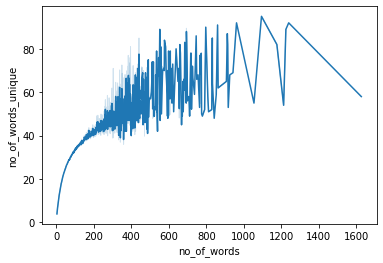

In [ ]:
import seaborn as sns
sns.lineplot(x = 'no_of_words',y = 'no_of_words_unique', data = df1 )

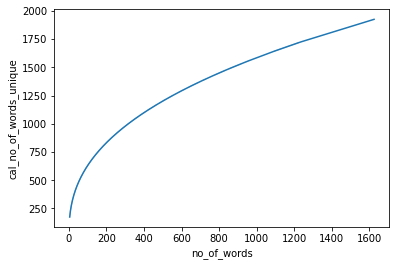

In [ ]:
sns.lineplot(x = 'no_of_words',y = 'cal_no_of_words_unique', data = df1 )

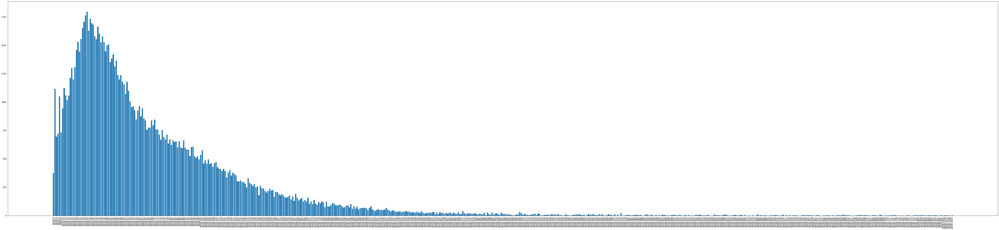

In [ ]:
import matplotlib.pyplot as plt
t1 = pd.DataFrame(df1[['no_of_words','sentence']].groupby('no_of_words').count())
t1 = t1.reset_index()
t1['no_of_words'] = 'words:' + t1['no_of_words'].astype(str)
t1.sort_values(by = 'sentence', ascending = False)
fig = plt.figure(figsize=(90, 20))
#creating the bar plot
plt.bar(t1['no_of_words'], t1['sentence']);
plt.xticks(rotation=90);

In [ ]:
from collections import Counter
result = Counter(" ".join(df1['sentence'].values.tolist()).split(" ")).items()
result

dict_items([('प', 218755), ('ा', 728787), ('ल', 201717), ('क', 609833), ('', 4309864), ('स', 360562), ('ि', 358070), ('न', 359643), ('्', 458574), ('“', 1573), ('इ', 49411), ('श', 82717), ('.', 17173), ('ब', 122414), ('ै', 126731), ('ठ', 9504), ('ो', 230101), ('र', 553005), ('ध', 57343), ('थ', 66515), ('ु', 114159), ('उ', 58189), ('य', 243266), ('अ', 83569), ('ी', 316229), ('ग', 115793), ('व', 189772), ('1', 12207), ('2', 6699), ('ओ', 11007), ('ह', 328400), ('ं', 331046), ('म', 276789), ('त', 335605), ('3', 4370), (')', 11645), ('ख', 40837), ('भ', 72342), ('ई', 23237), ('ढ', 7690), ('च', 69118), ('N', 648), ('F', 329), ('B', 549), ('ँ', 9993), ('फ', 25407), ('े', 520593), ('द', 166025), ('ड', 45090), ('छ', 22865), ('(', 14045), ('ौ', 12860), ('आ', 51155), ('ू', 60824), ('झ', 6400), ('ज', 142321), ('0', 9868), ('5', 4381), ('ृ', 14135), ('़', 44259), ('औ', 49366), ('९', 2545), ('०', 5773), ('/', 831), ('१', 4726), ('4', 3843), ('9', 7076), ('ण', 40309), ('ट', 57801), ('ऊ', 7094), ('घ', 

In [ ]:
from collections import Counter
cnt = Counter()
j = 0
for text in word_list:
    for t in text:
        cnt[t] += 1
# See most common ten words
cnt.most_common(10)

[('ा', 728828),
 ('क', 609870),
 ('र', 553051),
 ('े', 520623),
 ('्', 458612),
 ('स', 360597),
 ('न', 359688),
 ('ि', 358083),
 ('त', 335620),
 ('ं', 331060)]

In [ ]:
type(cnt)

collections.Counter

In [ ]:
import pandas as pd
word_freq = pd.DataFrame(cnt.most_common(300),columns=['words', 'count'])
word_freq.head(10)

,words,count
0,ा,728828
1,क,609870
2,र,553051
3,े,520623
4,्,458612
5,स,360597
6,न,359688
7,ि,358083
8,त,335620
9,ं,331060


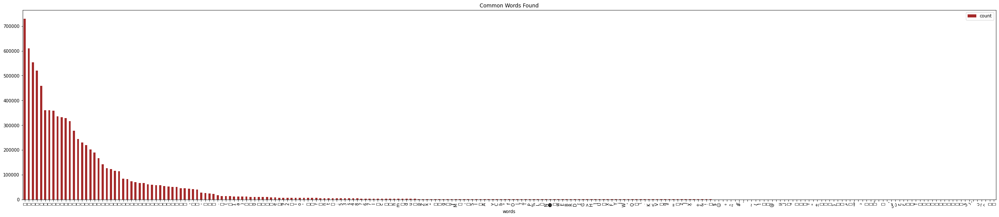

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(40, 8))

# Plot horizontal bar graph
word_freq.plot.bar(x='words',
                      y='count',
                      ax=ax,
                      color="brown")
ax.set_title("Common Words Found")
plt.show()


In [ ]:
word_freq['count'].sum()

8962844

In [ ]:
word_freq['count'].sum()
word_freq['proportion'] = word_freq['count']/8962844
pp = []
for i in range(word_freq.shape[0]):
    predicted_proportion = (1/(i+1))/8962844
    pp.append(predicted_proportion) 
word_freq['predicted_proportion'] = pp
word_freq.head()

,words,count,proportion,predicted_proportion
0,ा,728828,0.081317,1.115717e-07
1,क,609870,0.068044,5.578586e-08
2,र,553051,0.061705,3.719058e-08
3,े,520623,0.058087,2.789293e-08
4,्,458612,0.051168,2.231435e-08


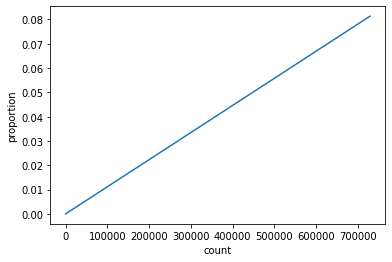

In [ ]:
sns.lineplot(x = 'count',y = 'proportion', data = word_freq )

Zipps Law

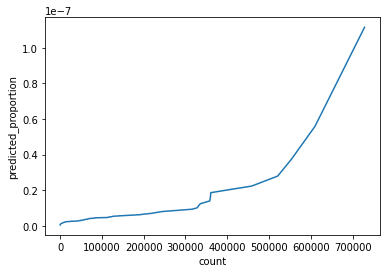

In [ ]:
sns.lineplot(x = 'count',y = 'predicted_proportion', data = word_freq )

In [ ]:
text = df['hindi_sentence'][1]

### Text Generation Output

In [ ]:
# Text Generation Based on Similar Sentences
from inltk.inltk import get_similar_sentences
get_similar_sentences(text, 10,'hi', degree_of_aug = 0.1)

['मार्च आपको ऐसे ही एक बच्चे के बारे में बताना चाहूंगी,',
 'सितम्बर आपको ऐसे ही एक बच्चे के बारे में बताना चाहूंगी,',
 'मई आपको ऐसे ही एक बच्चे की बारे में बताना चाहूंगी,',
 'फरवरी आपको ऐसे ही एक बच्चे के बारे में बताना चाहूंगी,',
 'मई आपको ऐसे ही एक बच्चे के संबंध में बताना चाहूंगी,',
 'मई आपको ऐसे ही एक बच्चे के बारे से बताना चाहूंगी,',
 'अक्तूबर आपको ऐसे ही एक बच्चे के बारे में बताना चाहूंगी,',
 'मई आपको ऐसे ही एक बच्चे के बारे को बताना चाहूंगी,',
 'मई आपको उस ही एक बच्चे के बारे में बताना चाहूंगी,',
 'मई आपको ऐसे ही एक बच्चे के बारेमे बताना चाहूंगी,']

In [ ]:
# Text Generation Based on Previous Words
from inltk.inltk import predict_next_words
predict_next_words(text, 6,'hi')

'मई आपको ऐसे ही एक बच्चे के बारे में बताना चाहूंगी, जो मेरे व्यक्तित्व के इर्द एक'

## Word Lemma, POS Tagger 

In [ ]:
!pip install inltk
!pip install indic-nlp-library
!pip install stanza

In [ ]:
from indicnlp.tokenize import indic_tokenize
from collections import Counter
indic_string = "आपल्या हिरड्यांच्या आणि दातांच्यामध्ये जीवाणू असतात"
x = []
stopwords = {"है","|","?","अंदर","अत","अदि","अप","अपना","अपनि","अपनी","अपने","अभि","अभी","आदि","आप","इंहिं","इंहें","इंहों","इतयादि","इत्यादि",
             "इन","इनका","इन्हीं","इन्हें","इन्हों","इस","इसका","इसकि","इसकी","इसके","इसमें","इसि","इसी","इसे","उंहिं","उंहें","उंहों","उन","उनका","उनकि",
             "उनकी","उनके","उनको","उन्हीं","उन्हें","उन्हों","उस","उसके","उसि","उसी","उसे","एक","एवं","एस","एसे","ऐसे","ओर","और","कइ","कई","कर",
             "करता","करते","करना","करने","करें","कहते","कहा","का","काफि","काफ़ी","कि","किंहें","किंहों","कितना","किन्हें","किन्हों","किया","किर","किस",
             "किसि","किसी","किसे","की","कुछ","कुल","के","को","कोइ","कोई","कोन","कोनसा","कौन","कौनसा","गया","घर","जब","जहाँ","जहां","जा","जिंहें","जिंहों","जितना",
             "जिधर","जिन","जिन्हें","जिन्हों","जिस","जिसे","जीधर","जेसा","जेसे","जैसा","जैसे","जो","तक","तब","तरह","तिंहें","तिंहों","तिन","तिन्हें","तिन्हों","तिस","तिसे",
             "तो","था","थि","थी","थे","दबारा","दवारा","दिया","दुसरा","दुसरे","दूसरे","दो","द्वारा","न","नहिं","नहीं","ना","निचे","निहायत","नीचे","ने","पर","पहले",
             "पुरा","पूरा","पे","फिर","बनि","बनी","बहि","बहुत","बाद","बाला","बिलकुल","भि","भितर","मगर","मानो","मे","में","यदि","यह","यहाँ","यहां","यहि",
             "यही","या","यिह","ये","रखें","रवासा","रहा","रहे","ऱ्वासा","लिए","लिये","लेकिन","व","वगेरह","वरग","वर्ग","वह","वहाँ","वहां","वहिं","वहीं","वाले","वुह","वे","वग़ैरह",
             "संग","सकता","सकते","सबसे","सभि","सभी","साथ","साबुत","साभ","सारा","से","सो","हि","ही","हुअ","हुआ","हुइ","हुई","हुए","हे","हें","है","हैं","हो",
             "होता","होति","होती","होते","होना","होने"}

print('Input String: {}'.format(indic_string))
print('Tokens: ')
for  t in indic_tokenize.trivial_tokenize(indic_string):
    x.append(t)
    print(t)
print(x)

Input String: आपल्या हिरड्यांच्या आणि दातांच्यामध्ये जीवाणू असतात
Tokens: 
आपल्या
हिरड्यांच्या
आणि
दातांच्यामध्ये
जीवाणू
असतात
['आपल्या', 'हिरड्यांच्या', 'आणि', 'दातांच्यामध्ये', 'जीवाणू', 'असतात']


In [ ]:
my_doc = [ele for ele in x if ele not in stopwords]
print("\nToken List after Preprocessing")
print(my_doc)


Token List after Preprocessing
['आपल्या', 'हिरड्यांच्या', 'आणि', 'दातांच्यामध्ये', 'जीवाणू', 'असतात']


In [ ]:
print('Word Frequency of Grams')
gram = Counter(my_doc)
gram = sorted(gram, key = lambda i:gram[i], reverse = True)[:10]
print("Top 10 Grams")
print(gram)

Word Frequency of Grams
Top 10 Grams
['आपल्या', 'हिरड्यांच्या', 'आणि', 'दातांच्यामध्ये', 'जीवाणू', 'असतात']


In [ ]:
print("Word Frequency of Bigrams")
bigram = Counter(zip(my_doc[::],my_doc[1::]))
print(bigram)
gram = sorted(gram, key = lambda i:bigram[i], reverse = True)[:10]
print("Top 10 Grams")
print(bigram)

Word Frequency of Bigrams
Counter({('आपल्या', 'हिरड्यांच्या'): 1, ('हिरड्यांच्या', 'आणि'): 1, ('आणि', 'दातांच्यामध्ये'): 1, ('दातांच्यामध्ये', 'जीवाणू'): 1, ('जीवाणू', 'असतात'): 1})
Top 10 Grams
Counter({('आपल्या', 'हिरड्यांच्या'): 1, ('हिरड्यांच्या', 'आणि'): 1, ('आणि', 'दातांच्यामध्ये'): 1, ('दातांच्यामध्ये', 'जीवाणू'): 1, ('जीवाणू', 'असतात'): 1})


In [ ]:
import stanza 
stanza.download('hi',verbose = False)
hi_nlp = stanza.Pipeline('hi',processors = 'tokenize,lemma,pos,depparse', verbose = False, use_gpu = False)
hi_doc = hi_nlp("आपल्या हिरड्यांच्या आणि दातांच्यामध्ये जीवाणू असतात")
print(type(hi_doc))

<class 'stanza.models.common.doc.Document'>


In [ ]:
for i,sent in enumerate(hi_doc.sentences):
    print("[Sentence {}]".format(i+1))
    for word in sent.words:
        print("{:12s}\t{:12s}\t{:6s}\t{:d}\t{:12s}".format(\
                                                           word.text, word.lemma,word.pos,word.head,word.deprel))
    print("")


[Sentence 1]
आपल्या      	आपल्या      	PROPN 	6	compound    
हिरड्यांच्या	हिरड्यांच्या	PROPN 	6	compound    
आणि         	आणि         	PROPN 	6	compound    
दातांच्यामध्ये	दातांच्यामध्ये	PROPN 	6	compound    
जीवाणू      	जीवाणू      	PROPN 	6	compound    
असतात       	असतात       	PROPN 	0	root        



In [ ]:
word = hi_doc.sentences[0].words[0]
print(word)

{
  "id": 1,
  "text": "आपल्या",
  "lemma": "आपल्या",
  "upos": "PROPN",
  "xpos": "NNPC",
  "feats": "Case=Nom|Gender=Masc|Number=Sing|Person=3",
  "head": 6,
  "deprel": "compound",
  "start_char": 0,
  "end_char": 6
}
